In [2]:
import os
import geopandas as gpd
import pandas as pd
import sys
import seaborn as sns
# Add project root to Python path
project_root = "/Users/inessat/Documents/phd/empirics/israel/notebooks/phd-remote-work"
if project_root not in sys.path:
    sys.path.append(project_root)

from geofunctions import utils
import matplotlib.pyplot as plt

In [79]:
months = utils.return_list_months_ok()
list_months = []
for MONTH in months:
    print(MONTH)
    try:
        df_part = pd.read_csv(
            utils.get_path(
                "processed", "dwells", f"remote_work/user_remote_work_{MONTH}.csv"
            )
        )
        df_part["month"] = MONTH
        list_months.append(df_part)
    except:
        pass

201901
201904
201907
201908
201909
201910
201911
202001
202002
202003
202004
202005
202006
202007
202008
202009
202010
202011
202101
202102
202103
202104
202105
202106
202107
202108
202109
202110
202111
202112
202201
202202
202203
202204
202205
202206
202207
202208
202209
202210
202211
202301
202302
202303
202304
202305
202306
202309


In [80]:
df_shares = pd.concat(list_months)

In [81]:
df_shares=df_shares[df_shares.month!='202206']
df_shares = df_shares.iloc[:,:-7]

## Description:
* total_work_days - days when specific user had work hours ( probability to be at work higher than to be at any other place)

In [82]:
df_shares.head()

,Unnamed: 0,identifier,identifier_type,remote_work_days,total_work_days,remote_work_days_smooth,remote_work_days_min_work,flag_remote_work_smoothed_max,flag_remote_work_smoothed_max_thresh,remote_work_share,remote_work_share_smooth,remote_work_share_min_work,month
0,0.0,00043c1c-bb6e-434c-8848-cd5bea2161a6,IDFA,0.0,16.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,201901
1,1.0,003b6189-ca3d-46e8-91aa-f9c271a8826e,GAID,5.0,12.0,5.0,3.0,0.185700,0.250000,0.416667,0.416667,0.250000,201901
2,2.0,0051f3fc-32d7-4686-ac58-214c62d6efd5,IDFA,2.0,20.0,2.0,0.0,0.043584,0.000000,0.100000,0.100000,0.000000,201901
3,3.0,0052e839-ea74-4c11-9c4a-2527e12126ff,IDFA,3.0,15.0,3.0,3.0,0.122194,0.200000,0.200000,0.200000,0.200000,201901
4,4.0,00596205-d7d0-4067-ae1b-dbe358625f14,IDFA,4.0,22.0,5.0,4.0,0.101286,0.181818,0.181818,0.227273,0.181818,201901


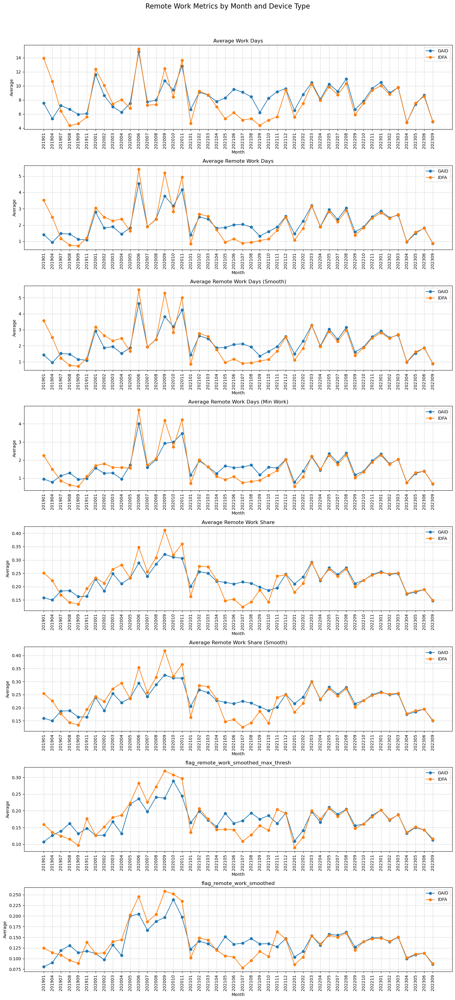


Detailed Statistics:
     month identifier_type  total_work_days  remote_work_days  remote_work_days_smooth  remote_work_days_min_work  remote_work_share  remote_work_share_smooth  remote_work_share_min_work  flag_remote_work_smoothed_max_thresh  flag_remote_work_smoothed_max
0   201901            GAID            7.568             1.410                    1.422                      0.948              0.159                     0.160                       0.107                                 0.107                          0.081
1   201901            IDFA           13.956             3.522                    3.566                      2.258              0.252                     0.255                       0.160                                 0.160                          0.125
2   201904            GAID            5.347             0.937                    0.945                      0.782              0.150                     0.151                       0.127                        

In [83]:
import seaborn as sns
# Calculate averages for all numeric columns
avg_by_month_type = df_shares.groupby(['month', 'identifier_type']).agg({
    'total_work_days': 'mean',
    'remote_work_days': 'mean',
    'remote_work_days_smooth': 'mean',
    'remote_work_days_min_work': 'mean',
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
}).reset_index()

# Create visualization for all metrics
metrics = [
    ('total_work_days', 'Average Work Days'),
    ('remote_work_days', 'Average Remote Work Days'),
    ('remote_work_days_smooth', 'Average Remote Work Days (Smooth)'),
    ('remote_work_days_min_work', 'Average Remote Work Days (Min Work)'),
    ('remote_work_share', 'Average Remote Work Share'),
    ('remote_work_share_smooth', 'Average Remote Work Share (Smooth)'),
    ("flag_remote_work_smoothed_max_thresh", "flag_remote_work_smoothed_max_thresh"),
    ("flag_remote_work_smoothed_max", "flag_remote_work_smoothed")
]

fig, axes = plt.subplots(len(metrics), 1, figsize=(15, 4*len(metrics)))
fig.suptitle('Remote Work Metrics by Month and Device Type', fontsize=16, y=1.02)

for i, (metric, title) in enumerate(metrics):
    for device_type in avg_by_month_type['identifier_type'].unique():
        data = avg_by_month_type[avg_by_month_type['identifier_type'] == device_type]
        axes[i].plot(data['month'], data[metric], marker='o', label=device_type)
    
    axes[i].set_title(title)
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average')
    axes[i].grid(True, linestyle='--', alpha=0.7)
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=90)
    
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(avg_by_month_type.round(3).to_string())

In [63]:
excluded_months = []
# Based on avg number of work days
excluded_months = excluded_months+['202304','202309']

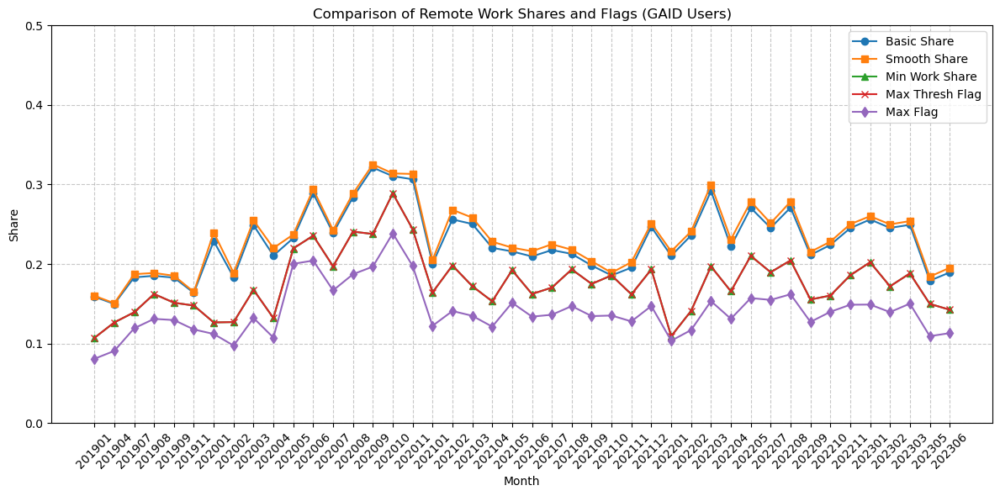


Detailed Statistics for GAID Users:
     month  remote_work_share  remote_work_share_smooth  remote_work_share_min_work  flag_remote_work_smoothed_max_thresh  flag_remote_work_smoothed_max
0   201901              0.159                     0.160                       0.107                                 0.107                          0.081
1   201904              0.150                     0.151                       0.127                                 0.127                          0.091
2   201907              0.183                     0.187                       0.139                                 0.139                          0.119
3   201908              0.185                     0.189                       0.162                                 0.162                          0.131
4   201909              0.183                     0.185                       0.151                                 0.151                          0.129
5   201911              0.164                

In [64]:
# Filter for GAID and calculate averages
avg_by_month_gaid = df_shares[(df_shares['identifier_type'] == 'GAID')&(~df_shares.month.isin(excluded_months))].groupby('month').agg({
    'remote_work_share': 'mean',
    'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
}).reset_index()

# Create single plot comparing all share metrics
plt.figure(figsize=(12, 6))

# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share'], 
         marker='o', 
         label='Basic Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_smooth'], 
         marker='s', 
         label='Smooth Share')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_min_work'], 
         marker='^', 
         label='Min Work Share')

# Plot flag metrics on the same figure
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['flag_remote_work_smoothed_max_thresh'], 
         marker='x', 
         label='Max Thresh Flag')
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['flag_remote_work_smoothed_max'], 
         marker='d', 
         label='Max Flag')

plt.title('Comparison of Remote Work Shares and Flags (GAID Users)', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Share')
plt.ylim(0,0.5)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics for GAID Users:")
print(avg_by_month_gaid.round(3).to_string())

# Statistic by date and month

In [74]:
months = utils.return_list_months_ok()
list_months_dates = []
for MONTH in months:
    print(MONTH)
    try:
        df_part = pd.read_csv(
            utils.get_path(
                "processed", "dwells", f"remote_work/remote_work_stats_hour_date_{MONTH}.csv"
            )
        )
        df_part["month"] = MONTH
        print(df_part.shape)
        list_months_dates.append(df_part)
    except:
        pass

201901
(1500, 9)
201904
(1449, 9)
201907
(1499, 9)
201908
(1490, 9)
201909
(1436, 9)
201910
201911
(1428, 9)
202001
(1500, 9)
202002
(1403, 9)
202003
(1488, 9)
202004
(1449, 9)
202005
(1502, 9)
202006
(1440, 9)
202007
(1501, 9)
202008
(1499, 9)
202009
(1436, 9)
202010
(1491, 9)
202011
(1451, 9)
202101
(1498, 9)
202102
(1356, 9)
202103
(1469, 9)
202104
(1449, 9)
202105
(1463, 9)
202106
(1358, 9)
202107
(1418, 9)
202108
(1315, 9)
202109
(1228, 9)
202110
(1354, 9)
202111
(1208, 9)
202112
(1486, 9)
202201
(1118, 9)
202202
(1355, 9)
202203
(1426, 9)
202204
(1454, 9)
202205
(1490, 9)
202206
202207
(1478, 9)
202208
(1501, 9)
202209
(1436, 9)
202210
(1496, 9)
202211
(1452, 9)
202301
(1500, 9)
202302
(1356, 9)
202303
(1485, 9)
202304
(1449, 9)
202305
(1478, 9)
202306
(1440, 9)
202309
(1285, 9)


In [75]:
df_shares_dates = pd.concat(list_months_dates)

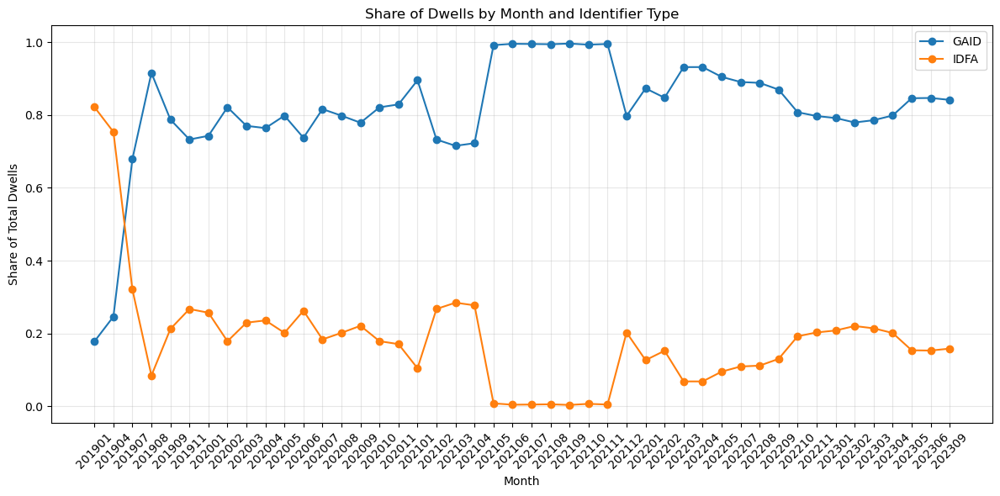

In [67]:
# Group by month and identifier type to get total count_dwells
monthly_counts = df_shares_dates.groupby(['month', 'identifier_type'])['count_dwells'].sum().reset_index()

# Calculate total counts per month to get shares
monthly_totals = monthly_counts.groupby('month')['count_dwells'].sum().reset_index()
monthly_counts = monthly_counts.merge(monthly_totals, on='month', suffixes=('', '_total'))
monthly_counts['share'] = monthly_counts['count_dwells'] / monthly_counts['count_dwells_total']

# Create plot
plt.figure(figsize=(12, 6))

# Plot lines for each identifier type
for id_type in monthly_counts['identifier_type'].unique():
    data = monthly_counts[monthly_counts['identifier_type'] == id_type]
    plt.plot(data['month'], data['share'], marker='o', label=id_type)

plt.title('Share of Dwells by Month and Identifier Type')
plt.xlabel('Month')
plt.ylabel('Share of Total Dwells')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [68]:
df_shares_dates[(df_shares_dates['month']=='202304')]

,Unnamed: 0,date,hour,identifier_type,flag_remote_work,flag_work_hours,flag_remote_work_smoothed,count_dwells,month
0,0,2023-04-01,0,GAID,0,0,0.0,949,202304
1,1,2023-04-01,0,IDFA,0,0,0.0,220,202304
2,2,2023-04-01,1,GAID,0,0,0.0,472,202304
3,3,2023-04-01,1,IDFA,0,0,0.0,108,202304
4,4,2023-04-01,2,GAID,0,0,0.0,231,202304
...,...,...,...,...,...,...,...,...,...
1444,1444,2023-05-01,4,GAID,0,0,0.0,96,202304
1445,1445,2023-05-01,4,IDFA,0,0,0.0,17,202304
1446,1446,2023-05-01,5,GAID,0,0,0.0,42,202304
1447,1447,2023-05-01,5,IDFA,0,0,0.0,11,202304


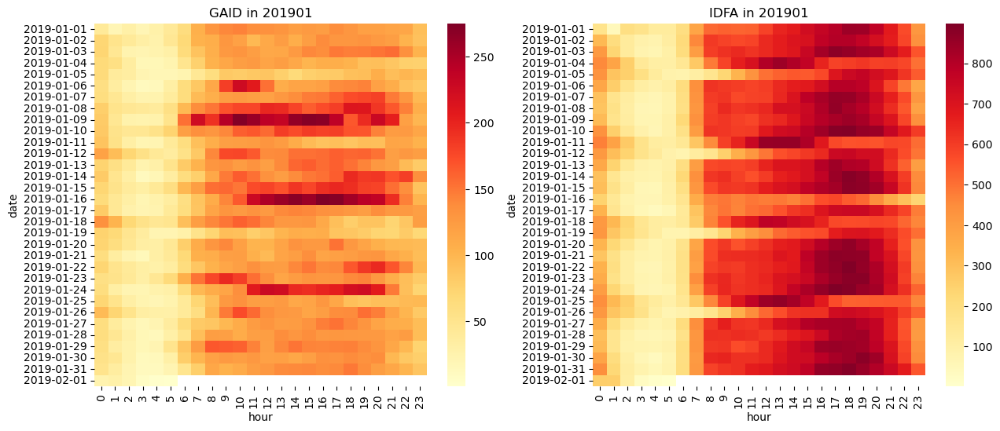

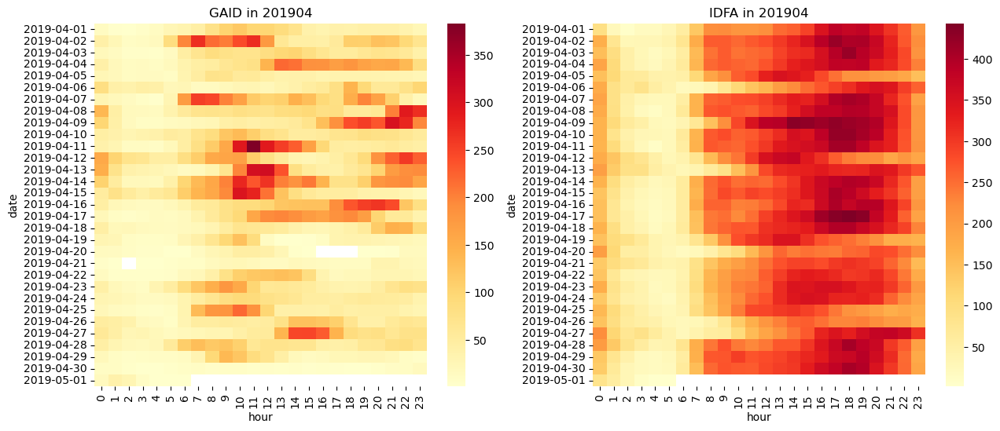

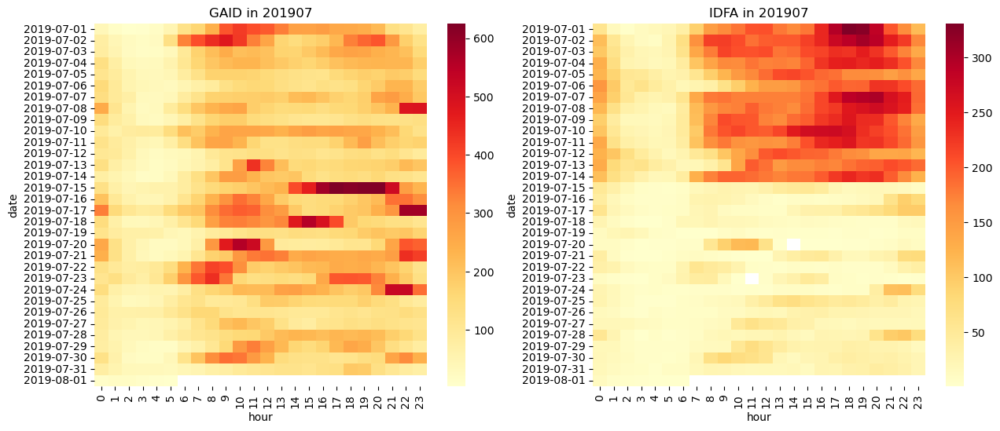

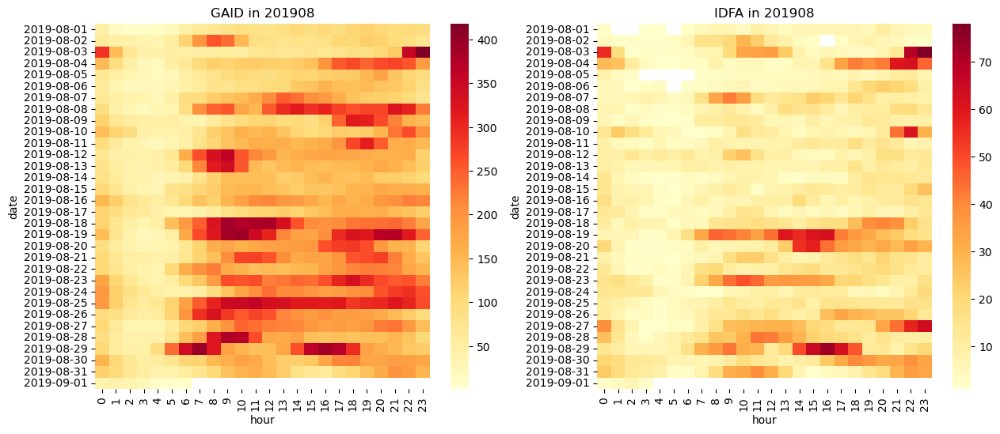

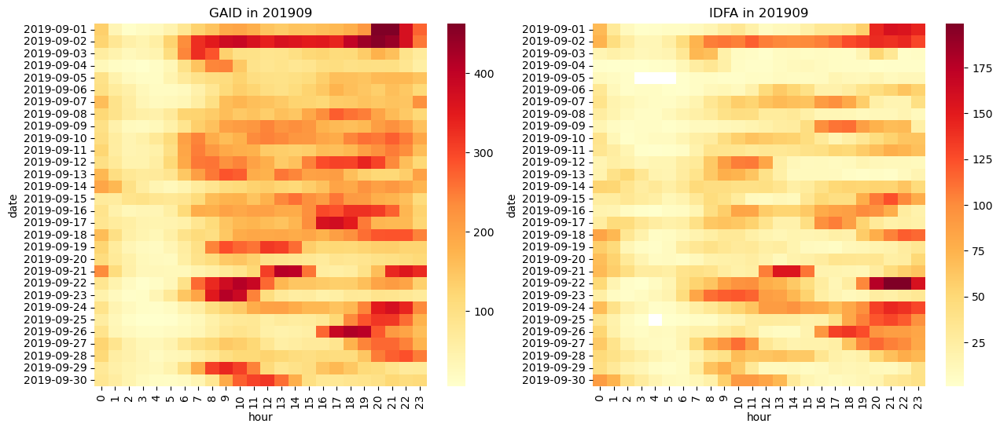

...

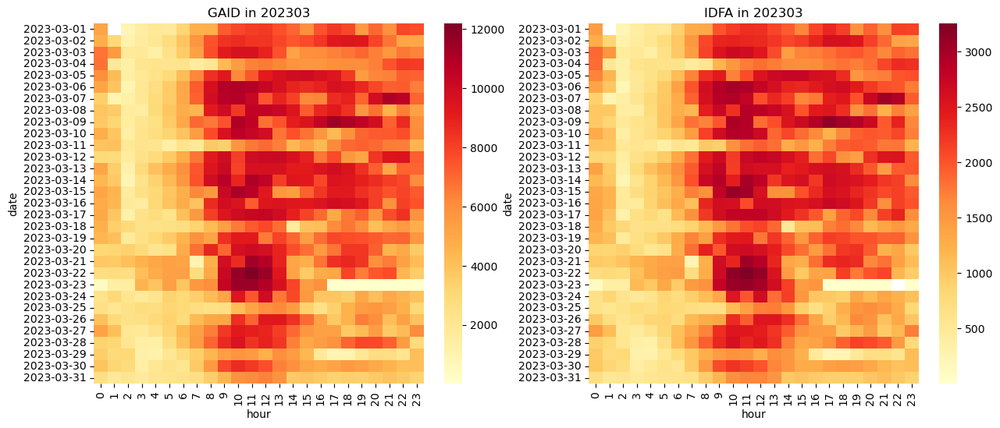

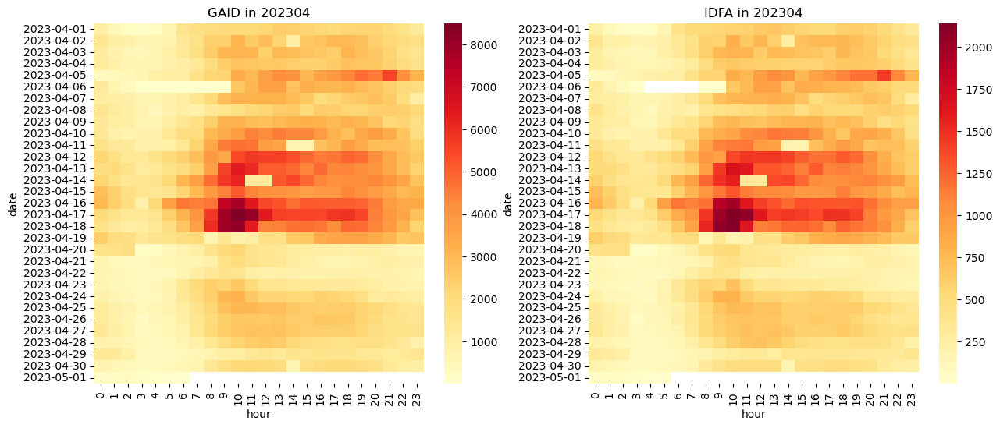

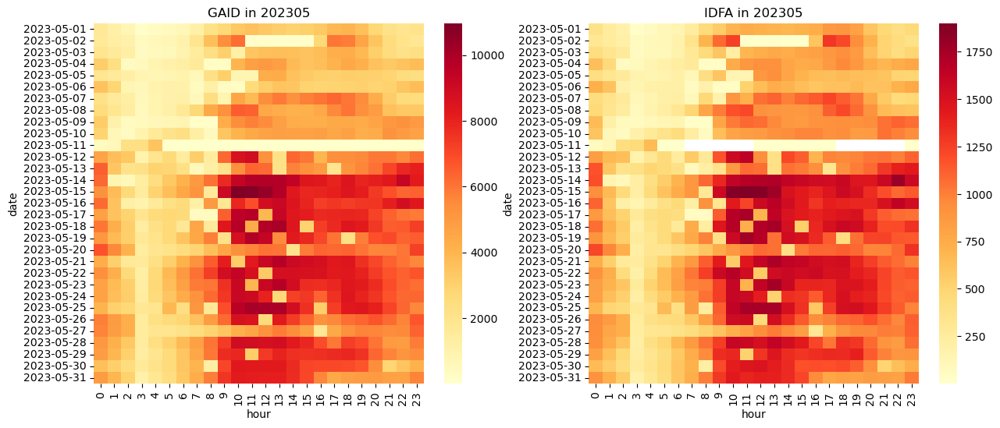

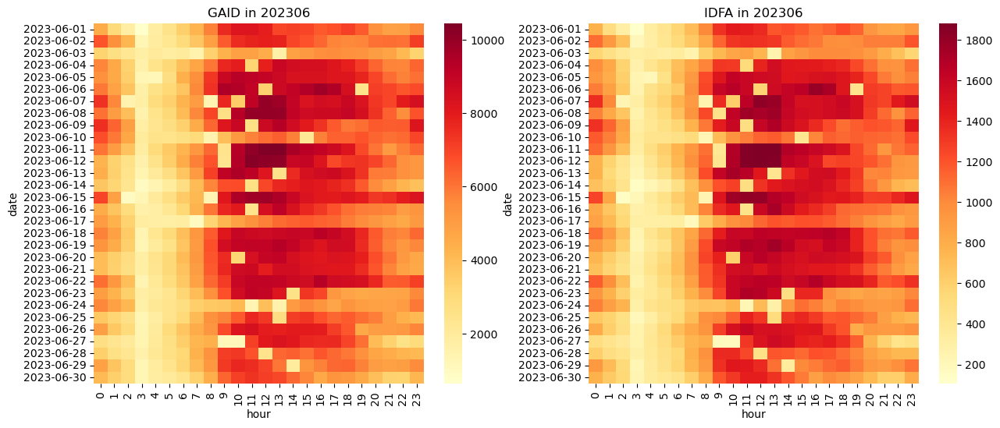

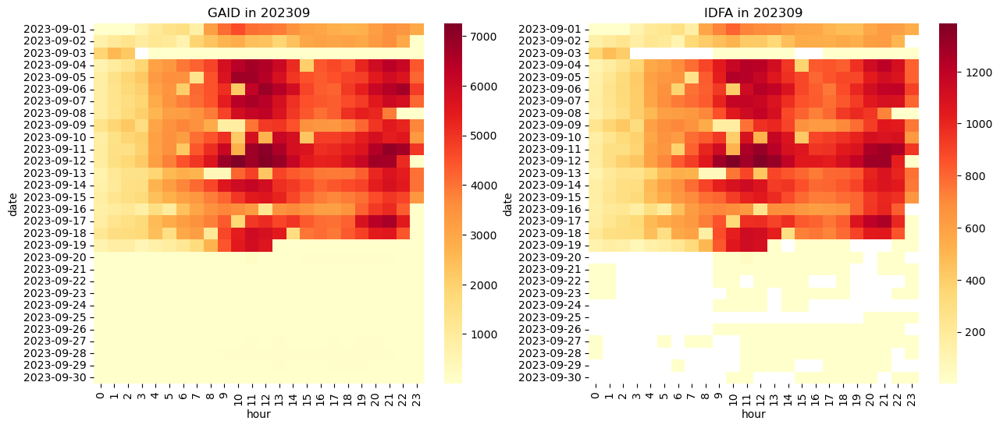

In [69]:
for MONTH in df_shares_dates['month'].unique():
    
    # Plot heatmap for GAID
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'GAID in {MONTH}')
    
    # Plot heatmap for IDFA
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='IDFA')]
                        , index="date", columns="hour", values="count_dwells"), cmap="YlOrRd")
    plt.title(f'IDFA in {MONTH}')
    plt.show()

In [44]:
excluded_months

['201908', '202101', '202109', '202309']

In [76]:
excluded_months = excluded_months+['201911','202008', '202007','202201']

In [77]:
df_shares_dates["share_remote_work"] = df_shares_dates["flag_remote_work"]/df_shares_dates["flag_work_hours"]

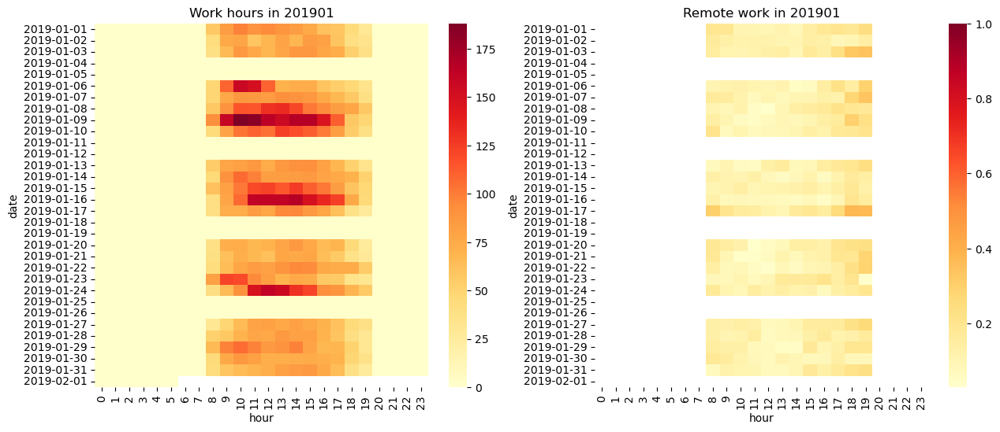

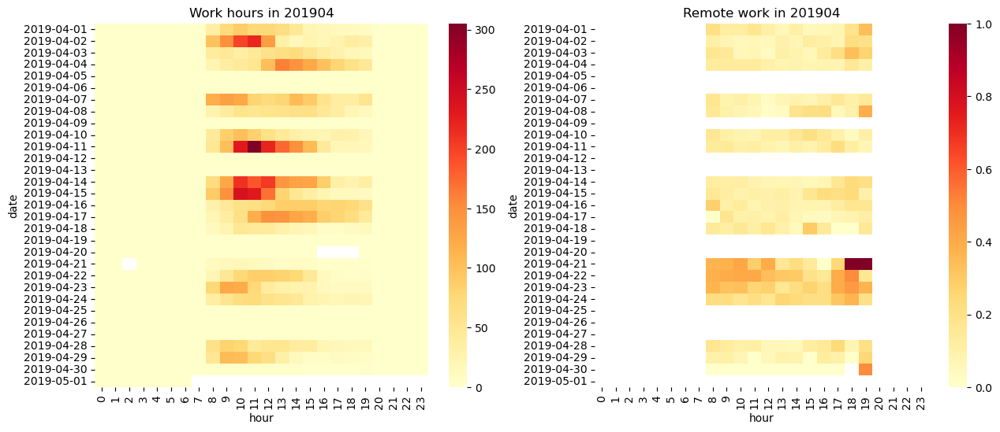

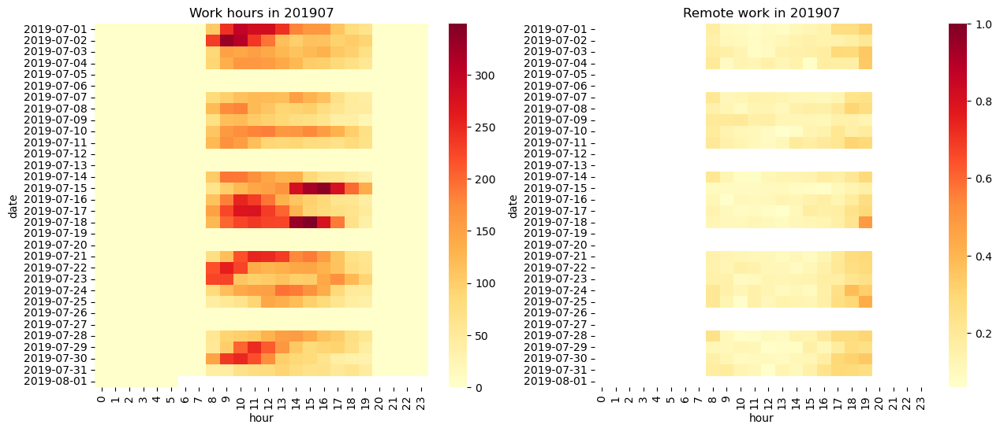

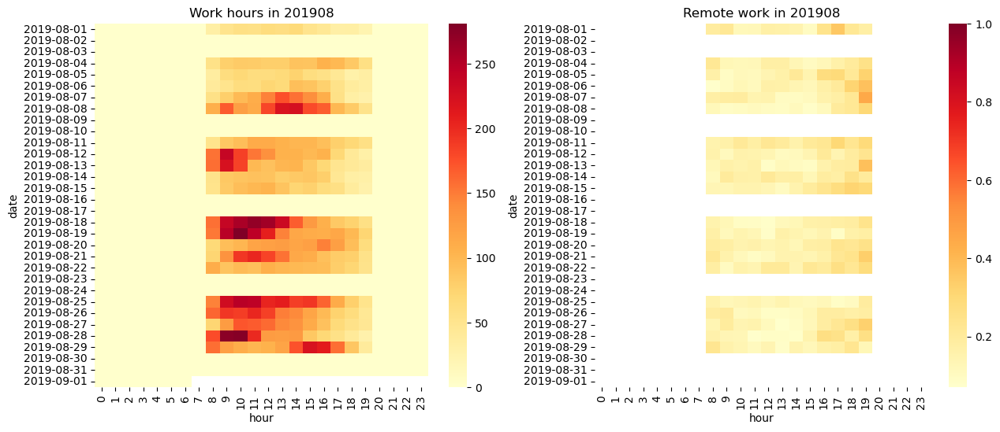

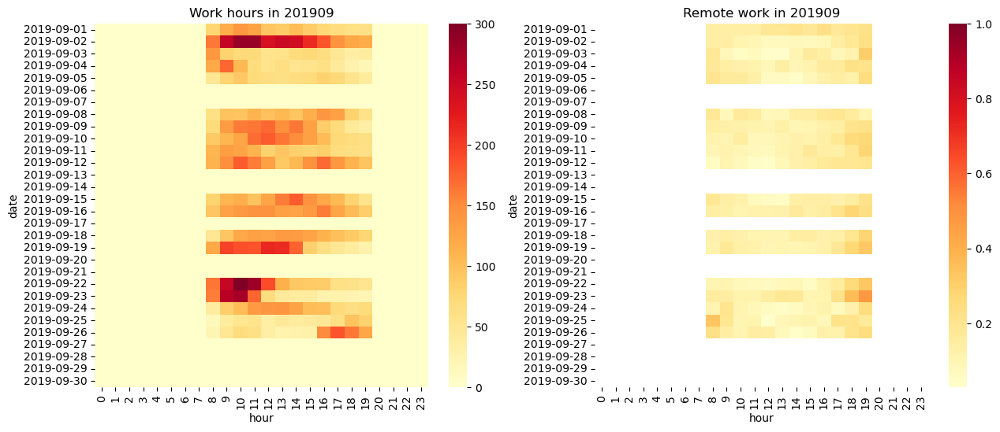

...

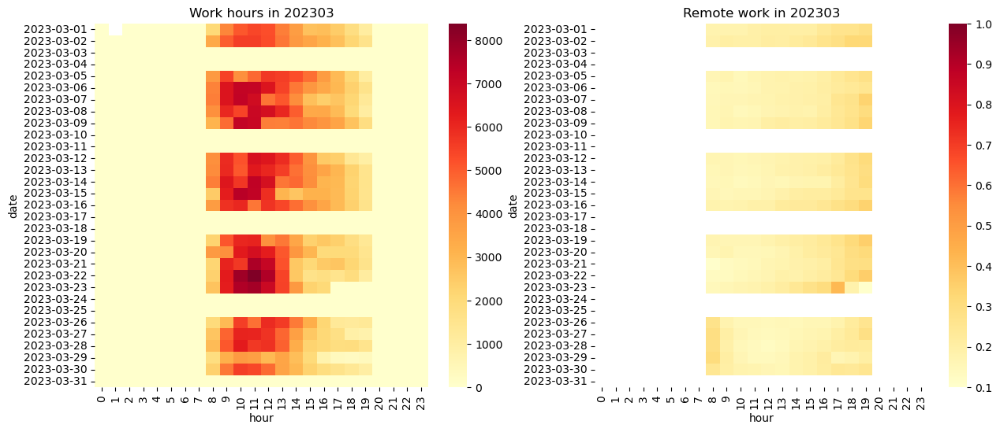

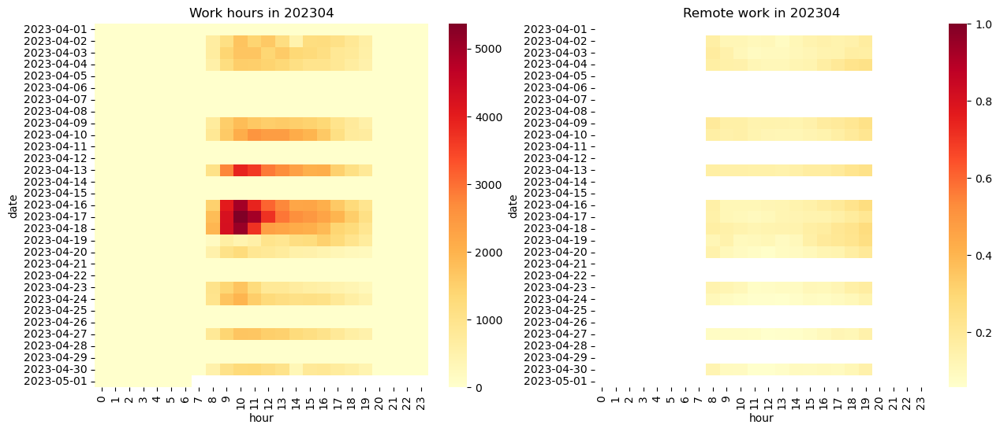

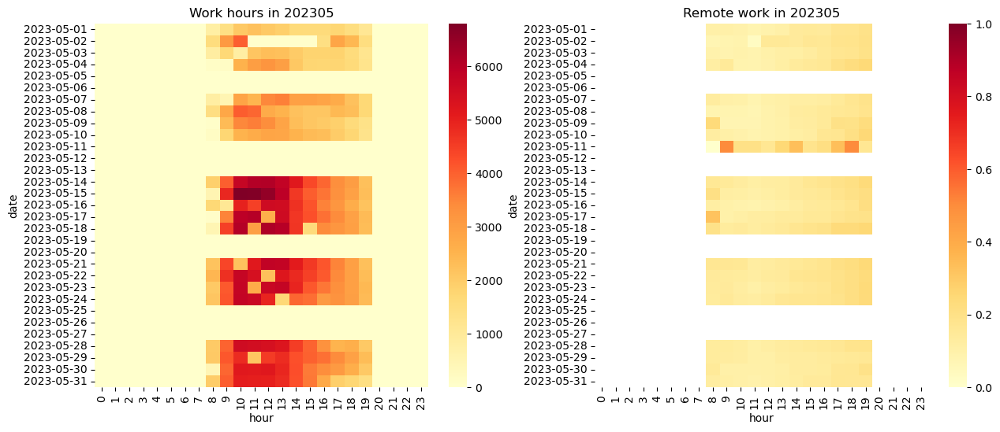

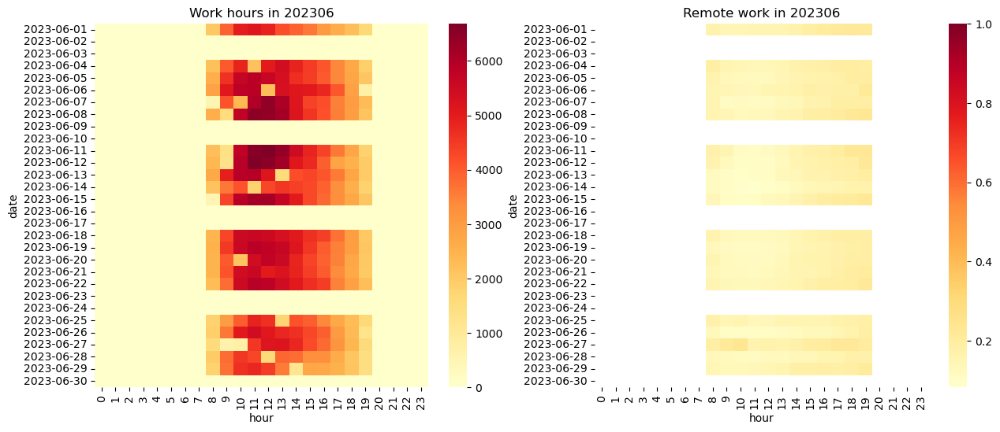

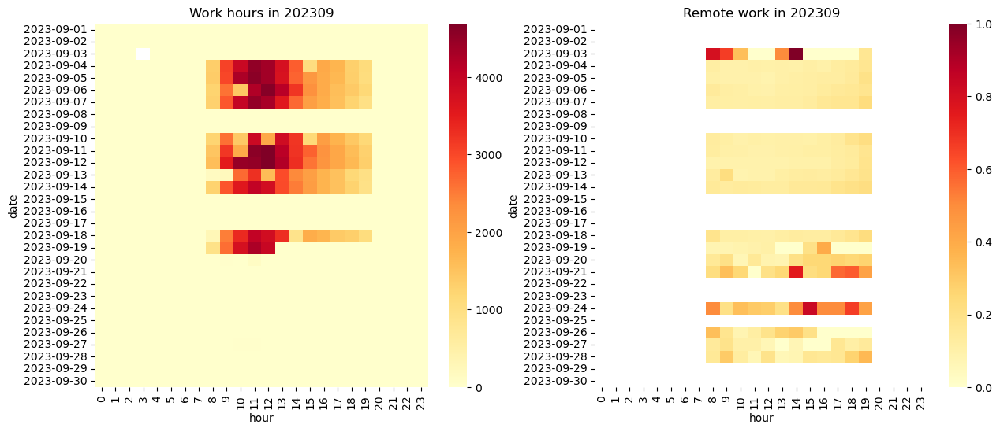

In [78]:
import seaborn as sns
for MONTH in df_shares_dates['month'].unique():
    
    # Plot heatmap for GAID
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="flag_work_hours"), cmap="YlOrRd")
    plt.title(f'Work hours in {MONTH}')
    
    # Plot heatmap for IDFA
    plt.subplot(1, 2, 2)
    sns.heatmap(pd.pivot(df_shares_dates[(df_shares_dates['month']==MONTH) & 
                                       (df_shares_dates['identifier_type']=='GAID')]
                        , index="date", columns="hour", values="share_remote_work"), cmap="YlOrRd", vmax=1)
    plt.title(f'Remote work in {MONTH}')
    plt.show()

In [22]:
# excluded_months = [
#                    "201911", 
#                    "202005", "202007", "202008", "202101",
#                    "202110", #because of low corr of home locations with population
#                      "202201", "202309", "202010"]

In [89]:
excluded_months = excluded_months+['201907','201908','202004','202101']

In [118]:
df_shares[['flag_remote_work_smoothed_max_thresh','remote_work_share_min_work',"flag_remote_work_smoothed_max"]]

,flag_remote_work_smoothed_max_thresh,remote_work_share_min_work,flag_remote_work_smoothed_max
0,0.000000,0.000000,0.000000
1,0.250000,0.250000,0.185700
2,0.000000,0.000000,0.043584
3,0.200000,0.200000,0.122194
4,0.181818,0.181818,0.101286
...,...,...,...
24714,0.000000,0.000000,0.000000
24715,0.000000,0.000000,0.000000
24716,0.000000,0.000000,0.000000
24717,0.000000,0.000000,0.000000


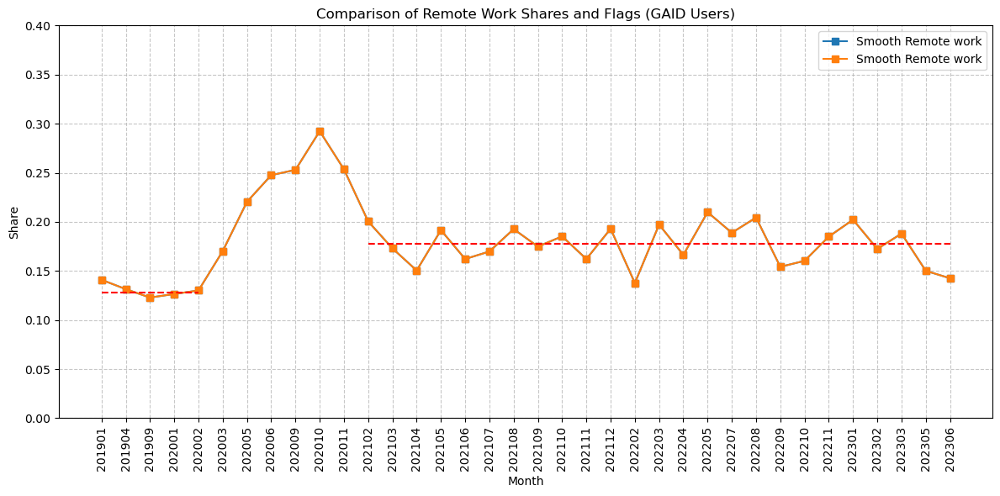


Detailed Statistics for GAID Users:
     month  remote_work_share_min_work  flag_remote_work_smoothed_max_thresh  flag_remote_work_smoothed_max
0   201901                       0.141                                 0.141                          0.109
1   201904                       0.131                                 0.131                          0.103
2   201909                       0.123                                 0.123                          0.108
3   202001                       0.127                                 0.127                          0.112
4   202002                       0.130                                 0.130                          0.099
5   202003                       0.170                                 0.170                          0.134
6   202005                       0.220                                 0.220                          0.201
7   202006                       0.248                                 0.248                       

In [113]:
# Filter for GAID and calculate averages
avg_by_month_gaid = df_shares[(~df_shares.month.isin(excluded_months))].groupby('month').agg({
    # 'remote_work_share': 'mean',
    # 'remote_work_share_smooth': 'mean',
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
}).reset_index()

# Calculate averages for specific periods
avg_201901_202002 = df_shares[(df_shares['month'].between('201901', '202002')) & (~df_shares.month.isin(excluded_months))].agg({
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
})

avg_202102_202306 = df_shares[(df_shares['month'].between('202102', '202306')) & (~df_shares.month.isin(excluded_months))].agg({
    'remote_work_share_min_work': 'mean',
    'flag_remote_work_smoothed_max_thresh': 'mean',
    'flag_remote_work_smoothed_max': 'mean'
})

# Create single plot comparing all share metrics
plt.figure(figsize=(12, 6))
# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['remote_work_share_min_work'], 
         marker='s', 
         label='Smooth Remote work')

# Plot each share metric
plt.plot(avg_by_month_gaid['month'], 
         avg_by_month_gaid['flag_remote_work_smoothed_max_thresh'], 
         marker='s', 
         label='Smooth Remote work')

# Add average lines to the plot
plt.plot(['201901', '201904', '201909', '202001', '202002'], [avg_201901_202002['flag_remote_work_smoothed_max_thresh']] * 5, color='r', linestyle='--')
months_after_covid = avg_by_month_gaid[avg_by_month_gaid['month']>'202101']['month'].unique().tolist()
plt.plot(months_after_covid, [avg_202102_202306['flag_remote_work_smoothed_max_thresh']] * len(months_after_covid), color='r', linestyle='--')

plt.title('Comparison of Remote Work Shares and Flags (GAID Users)', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Share')
plt.ylim(0,0.4)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics for GAID Users:")
print(avg_by_month_gaid.round(3).to_string())

In [110]:
avg_201901_202002['flag_remote_work_smoothed_max_thresh']

np.float64(0.12825744721019525)

In [112]:
avg_202102_202306['flag_remote_work_smoothed_max_thresh']

np.float64(0.17751113343927016)